# What contributes to a movie's commercial success?

Author: Cece Sun

Course Project, UC Irvine, Math 10, F22

## Introduction

This project investigates certain features that movies screening in the theater might have and dives into the correlation between each feature and the commercial success of a movie (i.e. the revenue each movie makes). Meanwhile, this project also shows us what the top revenue/top popularity movies and the top directors would be.
One important factor of a success of a movie is how much revenue it can generate. How is this feature correlating with others such as a movie's budget, popularity, and ratings? Let's take a look together.

## Getting Ready

Cleaning data and preparing it for future analysis and operations. 

In [1]:
import pandas as pd

There are 2 datasets used in this project. Merge them together by each movie's id number.

In [2]:
df_c = pd.read_csv("tmdb_5000_credits.csv")
df_c.head(3)

,movie_id,title,cast,crew
0,19995,Avatar,"[{""cast_id"": 242, ""character"": ""Jake Sully"", ""...","[{""credit_id"": ""52fe48009251416c750aca23"", ""de..."
1,285,Pirates of the Caribbean: At World's End,"[{""cast_id"": 4, ""character"": ""Captain Jack Spa...","[{""credit_id"": ""52fe4232c3a36847f800b579"", ""de..."
2,206647,Spectre,"[{""cast_id"": 1, ""character"": ""James Bond"", ""cr...","[{""credit_id"": ""54805967c3a36829b5002c41"", ""de..."


In [3]:
df_m = pd.read_csv("tmdb_5000_movies.csv")
df_m.head(3)

,budget,genres,homepage,id,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,tagline,title,vote_average,vote_count
0,237000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.avatarmovie.com/,19995,"[{""id"": 1463, ""name"": ""culture clash""}, {""id"":...",en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[{""name"": ""Ingenious Film Partners"", ""id"": 289...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2009-12-10,2787965087,162.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}, {""iso...",Released,Enter the World of Pandora.,Avatar,7.2,11800
1,300000000,"[{""id"": 12, ""name"": ""Adventure""}, {""id"": 14, ""...",http://disney.go.com/disneypictures/pirates/,285,"[{""id"": 270, ""name"": ""ocean""}, {""id"": 726, ""na...",en,Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...",139.082615,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2007-05-19,961000000,169.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"At the end of the world, the adventure begins.",Pirates of the Caribbean: At World's End,6.9,4500
2,245000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.sonypictures.com/movies/spectre/,206647,"[{""id"": 470, ""name"": ""spy""}, {""id"": 818, ""name...",en,Spectre,A cryptic message from Bond’s past sends him o...,107.376788,"[{""name"": ""Columbia Pictures"", ""id"": 5}, {""nam...","[{""iso_3166_1"": ""GB"", ""name"": ""United Kingdom""...",2015-10-26,880674609,148.0,"[{""iso_639_1"": ""fr"", ""name"": ""Fran\u00e7ais""},...",Released,A Plan No One Escapes,Spectre,6.3,4466


In [4]:
df_m=df_m.rename(columns={"id" : "movie_id"})

In [5]:
df = df_m.merge(df_c, on="movie_id")
df.head(3)

,budget,genres,homepage,movie_id,keywords,original_language,original_title,overview,popularity,production_companies,...,runtime,spoken_languages,status,tagline,title_x,vote_average,vote_count,title_y,cast,crew
0,237000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.avatarmovie.com/,19995,"[{""id"": 1463, ""name"": ""culture clash""}, {""id"":...",en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[{""name"": ""Ingenious Film Partners"", ""id"": 289...",...,162.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}, {""iso...",Released,Enter the World of Pandora.,Avatar,7.2,11800,Avatar,"[{""cast_id"": 242, ""character"": ""Jake Sully"", ""...","[{""credit_id"": ""52fe48009251416c750aca23"", ""de..."
1,300000000,"[{""id"": 12, ""name"": ""Adventure""}, {""id"": 14, ""...",http://disney.go.com/disneypictures/pirates/,285,"[{""id"": 270, ""name"": ""ocean""}, {""id"": 726, ""na...",en,Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...",139.082615,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}, {""...",...,169.0,"[{""iso_639_1"": ""en"", ""name"": ""English""}]",Released,"At the end of the world, the adventure begins.",Pirates of the Caribbean: At World's End,6.9,4500,Pirates of the Caribbean: At World's End,"[{""cast_id"": 4, ""character"": ""Captain Jack Spa...","[{""credit_id"": ""52fe4232c3a36847f800b579"", ""de..."
2,245000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...",http://www.sonypictures.com/movies/spectre/,206647,"[{""id"": 470, ""name"": ""spy""}, {""id"": 818, ""name...",en,Spectre,A cryptic message from Bond’s past sends him o...,107.376788,"[{""name"": ""Columbia Pictures"", ""id"": 5}, {""nam...",...,148.0,"[{""iso_639_1"": ""fr"", ""name"": ""Fran\u00e7ais""},...",Released,A Plan No One Escapes,Spectre,6.3,4466,Spectre,"[{""cast_id"": 1, ""character"": ""James Bond"", ""cr...","[{""credit_id"": ""54805967c3a36829b5002c41"", ""de..."


In [6]:
df.columns

Index(['budget', 'genres', 'homepage', 'movie_id', 'keywords',
       'original_language', 'original_title', 'overview', 'popularity',
       'production_companies', 'production_countries', 'release_date',
       'revenue', 'runtime', 'spoken_languages', 'status', 'tagline',
       'title_x', 'vote_average', 'vote_count', 'title_y', 'cast', 'crew'],
      dtype='object')

Get rid of the overlapped columns and the data we are not interested in.

In [7]:
df2 = df.drop(columns = ["movie_id","homepage", "title_x", "title_y", "overview", "status", "tagline","spoken_languages"])
df2.head(3)

,budget,genres,keywords,original_language,original_title,popularity,production_companies,production_countries,release_date,revenue,runtime,vote_average,vote_count,cast,crew
0,237000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...","[{""id"": 1463, ""name"": ""culture clash""}, {""id"":...",en,Avatar,150.437577,"[{""name"": ""Ingenious Film Partners"", ""id"": 289...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2009-12-10,2787965087,162.0,7.2,11800,"[{""cast_id"": 242, ""character"": ""Jake Sully"", ""...","[{""credit_id"": ""52fe48009251416c750aca23"", ""de..."
1,300000000,"[{""id"": 12, ""name"": ""Adventure""}, {""id"": 14, ""...","[{""id"": 270, ""name"": ""ocean""}, {""id"": 726, ""na...",en,Pirates of the Caribbean: At World's End,139.082615,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2007-05-19,961000000,169.0,6.9,4500,"[{""cast_id"": 4, ""character"": ""Captain Jack Spa...","[{""credit_id"": ""52fe4232c3a36847f800b579"", ""de..."
2,245000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...","[{""id"": 470, ""name"": ""spy""}, {""id"": 818, ""name...",en,Spectre,107.376788,"[{""name"": ""Columbia Pictures"", ""id"": 5}, {""nam...","[{""iso_3166_1"": ""GB"", ""name"": ""United Kingdom""...",2015-10-26,880674609,148.0,6.3,4466,"[{""cast_id"": 1, ""character"": ""James Bond"", ""cr...","[{""credit_id"": ""54805967c3a36829b5002c41"", ""de..."


Get rid of all the na values.

In [8]:
df3 = df2.dropna()
df3.head(3)

,budget,genres,keywords,original_language,original_title,popularity,production_companies,production_countries,release_date,revenue,runtime,vote_average,vote_count,cast,crew
0,237000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...","[{""id"": 1463, ""name"": ""culture clash""}, {""id"":...",en,Avatar,150.437577,"[{""name"": ""Ingenious Film Partners"", ""id"": 289...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2009-12-10,2787965087,162.0,7.2,11800,"[{""cast_id"": 242, ""character"": ""Jake Sully"", ""...","[{""credit_id"": ""52fe48009251416c750aca23"", ""de..."
1,300000000,"[{""id"": 12, ""name"": ""Adventure""}, {""id"": 14, ""...","[{""id"": 270, ""name"": ""ocean""}, {""id"": 726, ""na...",en,Pirates of the Caribbean: At World's End,139.082615,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2007-05-19,961000000,169.0,6.9,4500,"[{""cast_id"": 4, ""character"": ""Captain Jack Spa...","[{""credit_id"": ""52fe4232c3a36847f800b579"", ""de..."
2,245000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...","[{""id"": 470, ""name"": ""spy""}, {""id"": 818, ""name...",en,Spectre,107.376788,"[{""name"": ""Columbia Pictures"", ""id"": 5}, {""nam...","[{""iso_3166_1"": ""GB"", ""name"": ""United Kingdom""...",2015-10-26,880674609,148.0,6.3,4466,"[{""cast_id"": 1, ""character"": ""James Bond"", ""cr...","[{""credit_id"": ""54805967c3a36829b5002c41"", ""de..."


Rename some column names to simplify future codes.

In [9]:
df4=df3.rename(columns = {"original_language":"language", "original_title":"title", "production_companies":"companies", "production_countries":"countries", "release_date":"date"})

Preparing the categorical data for future uses.
Particularly, extract the director name for each movie from the "crew" column.

In [10]:
from ast import literal_eval
features = ["genres", "keywords", "companies", "countries", "cast", "crew"]
for feature in features:
    df4[feature] = df4[feature].apply(literal_eval)

In [11]:
import numpy as np

In [12]:
def get_director(x):
    for i in x:
        if i["job"] == "Director":
            return i["name"]
    return np.nan 

In [13]:
def get_list(x):
    if isinstance(x, list):
        names = [i["name"] for i in x]
        if len(names)>3:
            names = names[:3]
        return names
    return[]

In [14]:
df4["director"] = df4["crew"].apply(get_director)

features = ["cast", "keywords", "genres","companies", "countries"]
for feature in features:
    df4[feature] = df4[feature].apply(get_list)

In [15]:
df5 = df4.drop(columns = ["crew"]).dropna()
df5.head(3)

,budget,genres,keywords,language,title,popularity,companies,countries,date,revenue,runtime,vote_average,vote_count,cast,director
0,237000000,"[Action, Adventure, Fantasy]","[culture clash, future, space war]",en,Avatar,150.437577,"[Ingenious Film Partners, Twentieth Century Fo...","[United States of America, United Kingdom]",2009-12-10,2787965087,162.0,7.2,11800,"[Sam Worthington, Zoe Saldana, Sigourney Weaver]",James Cameron
1,300000000,"[Adventure, Fantasy, Action]","[ocean, drug abuse, exotic island]",en,Pirates of the Caribbean: At World's End,139.082615,"[Walt Disney Pictures, Jerry Bruckheimer Films...",[United States of America],2007-05-19,961000000,169.0,6.9,4500,"[Johnny Depp, Orlando Bloom, Keira Knightley]",Gore Verbinski
2,245000000,"[Action, Adventure, Crime]","[spy, based on novel, secret agent]",en,Spectre,107.376788,"[Columbia Pictures, Danjaq, B24]","[United Kingdom, United States of America]",2015-10-26,880674609,148.0,6.3,4466,"[Daniel Craig, Christoph Waltz, Léa Seydoux]",Sam Mendes


In [16]:
df5["date"] = pd.to_datetime(df5["date"])

Reorder the columns' positions in a way I want them to be.

In [17]:
ordered_col = ["title", "date", "revenue","budget", "popularity","runtime", "vote_average", "vote_count", "countries", "language", "genres", "keywords", "director", "cast"]

In [18]:
df6=df5[ordered_col]

## Movie Ranking

What are the top5 movies based on their revenue? Popularity? `##`

In [19]:
df6.sort_values(by="revenue", ascending=False).head(5)

,title,date,revenue,budget,popularity,runtime,vote_average,vote_count,countries,language,genres,keywords,director,cast
0,Avatar,2009-12-10,2787965087,237000000,150.437577,162.0,7.2,11800,"[United States of America, United Kingdom]",en,"[Action, Adventure, Fantasy]","[culture clash, future, space war]",James Cameron,"[Sam Worthington, Zoe Saldana, Sigourney Weaver]"
25,Titanic,1997-11-18,1845034188,200000000,100.025899,194.0,7.5,7562,[United States of America],en,"[Drama, Romance, Thriller]","[shipwreck, iceberg, ship]",James Cameron,"[Kate Winslet, Leonardo DiCaprio, Frances Fisher]"
16,The Avengers,2012-04-25,1519557910,220000000,144.448633,143.0,7.4,11776,[United States of America],en,"[Science Fiction, Action, Adventure]","[new york, shield, marvel comic]",Joss Whedon,"[Robert Downey Jr., Chris Evans, Mark Ruffalo]"
28,Jurassic World,2015-06-09,1513528810,150000000,418.708552,124.0,6.5,8662,[United States of America],en,"[Action, Adventure, Science Fiction]","[monster, dna, tyrannosaurus rex]",Colin Trevorrow,"[Chris Pratt, Bryce Dallas Howard, Irrfan Khan]"
44,Furious 7,2015-04-01,1506249360,190000000,102.322217,137.0,7.3,4176,"[Japan, United States of America]",en,[Action],"[car race, speed, revenge]",James Wan,"[Vin Diesel, Paul Walker, Dwayne Johnson]"


Text(0.5, 1.0, 'Profitable Movies')

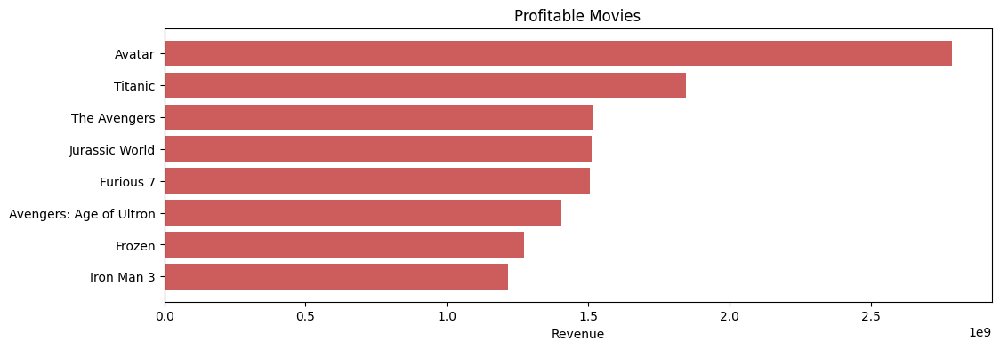

In [20]:
pop = df6.sort_values('revenue', ascending=False)
import matplotlib.pyplot as plt
plt.figure(figsize=(12,4))

plt.barh(pop['title'].head(8),pop['revenue'].head(8), align='center',
        color='indianred')
plt.gca().invert_yaxis()
plt.xlabel("Revenue")
plt.title("Profitable Movies")

From this bar chart we can see that "Avatar", "Titanic", and "The Avegers(the first one)" are the top 3 most profitable movies.

In [21]:
df6.sort_values(by="popularity", ascending=False).head(5)

,title,date,revenue,budget,popularity,runtime,vote_average,vote_count,countries,language,genres,keywords,director,cast
546,Minions,2015-06-17,1156730962,74000000,875.581305,91.0,6.4,4571,[United States of America],en,"[Family, Animation, Adventure]","[assistant, aftercreditsstinger, duringcredits...",Kyle Balda,"[Sandra Bullock, Jon Hamm, Michael Keaton]"
95,Interstellar,2014-11-05,675120017,165000000,724.247784,169.0,8.1,10867,"[Canada, United States of America, United King...",en,"[Adventure, Drama, Science Fiction]","[saving the world, artificial intelligence, fa...",Christopher Nolan,"[Matthew McConaughey, Jessica Chastain, Anne H..."
788,Deadpool,2016-02-09,783112979,58000000,514.569956,108.0,7.4,10995,[United States of America],en,"[Action, Adventure, Comedy]","[anti hero, mercenary, marvel comic]",Tim Miller,"[Ryan Reynolds, Morena Baccarin, Ed Skrein]"
94,Guardians of the Galaxy,2014-07-30,773328629,170000000,481.098624,121.0,7.9,9742,"[United Kingdom, United States of America]",en,"[Action, Science Fiction, Adventure]","[marvel comic, spaceship, space]",James Gunn,"[Chris Pratt, Zoe Saldana, Dave Bautista]"
127,Mad Max: Fury Road,2015-05-13,378858340,150000000,434.278564,120.0,7.2,9427,"[Australia, United States of America]",en,"[Action, Adventure, Science Fiction]","[future, chase, post-apocalyptic]",George Miller,"[Tom Hardy, Charlize Theron, Nicholas Hoult]"


Text(0.5, 1.0, 'Popular Movies')

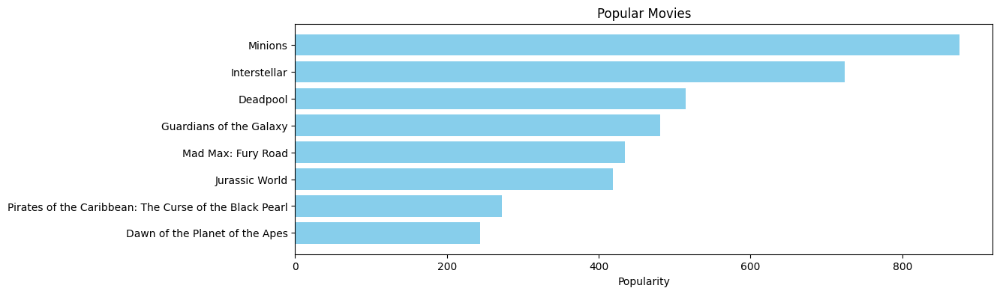

In [22]:
pop2 = df6.sort_values('popularity', ascending=False)
import matplotlib.pyplot as plt
plt.figure(figsize=(12,4))

plt.barh(pop2['title'].head(8),pop2['popularity'].head(8), align='center',
        color='skyblue')
plt.gca().invert_yaxis()
plt.xlabel("Popularity")
plt.title("Popular Movies")

From this bar chart we can see that "Minions", "Interstellar", and "Deadpool" are the top 3 most popular movies, which diverges from the top 3 most profitable movies.

## Computing a movie_score for each movie

### What are IMDb movie ratings?
IMDb registered users can cast a vote (from 1 to 10) on every released title in the database. Individual votes are then aggregated and summarized as a single IMDb rating, visible on the title's main page. By "released title" we mean that the movie (or TV show) must have been shown publicly at least once (including festival screening).

Users can update their votes as often as they'd like, but any new vote on the same title will overwrite the previous one, so it is one vote per title per user.


### How are the ratings calculated?
They take all the individual ratings cast by IMDb registered users and use them to calculate a single rating. They don't use the arithmetic mean (i.e. the sum of all votes divided by the number of votes), although they do display the mean and average votes on the votes breakdown page; instead the rating displayed on a title's page is a weighted average. 

The formula for calculating the Top Rated 250 Titles gives a true Bayesian estimate:
weighted rating (WR) = (v ÷ (v+m)) × R + (m ÷ (v+m)) × C where:

R = average for the movie (mean) = (Rating)
v = number of votes for the movie = (votes)
m = minimum votes required to be listed in the Top 250 (currently 25000)
C = the mean vote across the whole report (currently 7.0) `##`

In [23]:
C = df6["vote_average"].mean()
C

6.110207503667994

In [24]:
m = df6["vote_count"].quantile(0.9)
m

1862.0

In [25]:
movies2 = df6.copy().loc[df6["vote_count"] >= m]
len(movies2)

478

In [26]:
def weighted_rating(x, m=m, C=C):
    v = x["vote_count"]
    R = x["vote_average"]
    return(v/(v+m)*R) + (m/(m+v)*R)

In [27]:
movies2["score"] = movies2.apply(weighted_rating, axis=1)
df6["movie_scores"] = movies2["score"].round(2)

In [28]:
df6.sort_values(by="movie_scores", ascending=False).head(5)

,title,date,revenue,budget,popularity,runtime,vote_average,vote_count,countries,language,genres,keywords,director,cast,movie_scores
1881,The Shawshank Redemption,1994-09-23,28341469,25000000,136.747729,142.0,8.5,8205,[United States of America],en,"[Drama, Crime]","[prison, corruption, police brutality]",Frank Darabont,"[Tim Robbins, Morgan Freeman, Bob Gunton]",8.5
3337,The Godfather,1972-03-14,245066411,6000000,143.659698,175.0,8.4,5893,[United States of America],en,"[Drama, Crime]","[italy, love at first sight, loss of father]",Francis Ford Coppola,"[Marlon Brando, Al Pacino, James Caan]",8.4
2294,千と千尋の神隠し,2001-07-20,274925095,15000000,118.968562,125.0,8.3,3840,[Japan],ja,"[Fantasy, Adventure, Animation]","[witch, parents kids relationship, magic]",Hayao Miyazaki,"[Rumi Hiiragi, Miyu Irino, Mari Natsuki]",8.3
662,Fight Club,1999-10-15,100853753,63000000,146.757391,139.0,8.3,9413,"[Germany, United States of America]",en,[Drama],"[support group, dual identity, nihilism]",David Fincher,"[Edward Norton, Brad Pitt, Meat Loaf]",8.3
1818,Schindler's List,1993-11-29,321365567,22000000,104.469351,195.0,8.3,4329,[United States of America],en,"[Drama, History, War]","[factory, concentration camp, hero]",Steven Spielberg,"[Liam Neeson, Ben Kingsley, Ralph Fiennes]",8.3


## Visualize movies' revenue, budget, and ratings

Using altair to display charts containing movies' revenue, budget, and ratings information 

In [29]:
import altair as alt

In [30]:
df9 = df6[df6["revenue"] != 0]
df9

,title,date,revenue,budget,popularity,runtime,vote_average,vote_count,countries,language,genres,keywords,director,cast,movie_scores
0,Avatar,2009-12-10,2787965087,237000000,150.437577,162.0,7.2,11800,"[United States of America, United Kingdom]",en,"[Action, Adventure, Fantasy]","[culture clash, future, space war]",James Cameron,"[Sam Worthington, Zoe Saldana, Sigourney Weaver]",7.2
1,Pirates of the Caribbean: At World's End,2007-05-19,961000000,300000000,139.082615,169.0,6.9,4500,[United States of America],en,"[Adventure, Fantasy, Action]","[ocean, drug abuse, exotic island]",Gore Verbinski,"[Johnny Depp, Orlando Bloom, Keira Knightley]",6.9
2,Spectre,2015-10-26,880674609,245000000,107.376788,148.0,6.3,4466,"[United Kingdom, United States of America]",en,"[Action, Adventure, Crime]","[spy, based on novel, secret agent]",Sam Mendes,"[Daniel Craig, Christoph Waltz, Léa Seydoux]",6.3
3,The Dark Knight Rises,2012-07-16,1084939099,250000000,112.312950,165.0,7.6,9106,[United States of America],en,"[Action, Crime, Drama]","[dc comics, crime fighter, terrorist]",Christopher Nolan,"[Christian Bale, Michael Caine, Gary Oldman]",7.6
4,John Carter,2012-03-07,284139100,260000000,43.926995,132.0,6.1,2124,[United States of America],en,"[Action, Adventure, Science Fiction]","[based on novel, mars, medallion]",Andrew Stanton,"[Taylor Kitsch, Lynn Collins, Samantha Morton]",6.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4775,Funny Ha Ha,2002-09-20,76901,0,0.362633,85.0,6.3,8,[United States of America],en,"[Drama, Comedy]",[mumblecore],Andrew Bujalski,"[Kate Dollenmayer, Mark Herlehy, Christian Rud...",NaN
4788,Pink Flamingos,1972-03-12,6000000,12000,4.553644,93.0,6.2,110,[United States of America],en,"[Horror, Comedy, Crime]","[gay, trailer park, pop culture]",John Waters,"[Divine, David Lochary, Mary Vivian Pearce]",NaN
4792,キュア,1997-11-06,99000,20000,0.212443,111.0,7.4,63,[Japan],ja,"[Crime, Horror, Mystery]","[japan, prostitute, hotel]",Kiyoshi Kurosawa,"[Koji Yakusho, Masato Hagiwara, Tsuyoshi Ujiki]",NaN
4796,Primer,2004-10-08,424760,7000,23.307949,77.0,6.9,658,[United States of America],en,"[Science Fiction, Drama, Thriller]","[distrust, garage, identity crisis]",Shane Carruth,"[Shane Carruth, David Sullivan, Casey Gooden]",NaN


In [78]:
alt.Chart(df9).mark_circle().encode(
    x="budget",
    y="revenue",
    color="language",
    tooltip=("title", "budget", "revenue")
)

alt.Chart(...)

From this chart we can learn that generally the higher the budget, the higher the revenue. However, the revenue of a movie can depend on other features as well (not entirely affected by the budget), as we can see the highest budget movie "Pirates of the Caribbean: On Stranger Tides" is not even in the top10 most profitable movies. And "Avatar", which generated the highest revenue, did not spend the most money for production.

In [32]:
alt.Chart(df9).mark_circle().encode(
    alt.X("movie_scores",
        scale=alt.Scale(zero=False)
    ),
    y="revenue",
    size="popularity",
    color="title",
    tooltip=("title", "revenue", "popularity", "movie_scores")
)

alt.Chart(...)

From this chart, we can see that a movie's rating does not necessarily correlates its commercial success (revenue). Most of the top profitable movies distribute in the mid range of the movie ratings (6.0~8.0).

## Who are the top directors?

Making a sub-dataframe containing the top100 most profitable movies using their "revenue" ranking. 
Look for the top3 directors in this sub-dataframe by counting how many top100 movies are directed by them. 
Draw charts for all the movies made by these top3 directors separately.

In [33]:
df_top100=df6.sort_values("revenue", ascending=False).head(100)
df_top100["director"].value_counts().sort_values(ascending=False).head(3)

Peter Jackson    6
Michael Bay      4
George Lucas     4
Name: director, dtype: int64

In [34]:
df_topDirectors = df6.loc[(df6["director"] == "Peter Jackson") | (df6["director"] == "Michael Bay") | (df6["director"] == "Christopher Nolan")]

In [35]:
alt.Chart(df_topDirectors).mark_circle().encode(
    x=alt.X("movie_scores", scale=alt.Scale(zero=False)),
    y="revenue",
    size="popularity",
    color="title:N",
    tooltip=("director", "title", "revenue", "movie_scores")
).facet("director").resolve_scale(
    x='independent'
)

alt.FacetChart(...)

From these charts we can clearly see the comparison of these three directors. All three of them have directed some high office box movies. Michael Bay's movies have the lowest range of movie ratings among the three. And Nolan has directed the most popular movie "Insterstellar" among all the movies directed by these three directors.

## Relationship between a movie's revenue and its bugdet

Using linear regression to plot the regression line for "revenue" and "budget".

In [36]:
from sklearn.linear_model import LinearRegression

Create and fit the model

In [37]:
reg = LinearRegression()
reg.fit(df6[["budget"]], df6["revenue"])

LinearRegression()

Making Predictions

In [38]:
df6["pred"] = reg.predict(df6[["budget"]])

In [39]:
base = alt.Chart(df6).mark_circle().encode(
    x="budget",
    y="revenue"
)
base

alt.Chart(...)

In [40]:
c1 = alt.Chart(df6).mark_line().encode(
    x="budget",
    y="pred"
)
base+c1

alt.LayerChart(...)

In [41]:
reg.intercept_

-2632810.1895543337

In [42]:
reg.coef_

array([2.9228099])

## Coefficients of "popularity" and "runtime"

Using linear regression and feature_names_in_ to get the coefficients of feature "popularity" and "runtime".

In [43]:
cols2 = ["popularity", "runtime"]

In [44]:
reg2 = LinearRegression()
reg2.fit(df6[cols2], df6["revenue"])

LinearRegression()

In [45]:
pd.Series(reg2.coef_, index=reg2.feature_names_in_)

popularity    3.168460e+06
runtime       8.436382e+05
dtype: float64

## Which genres is more likely to bring a movie high revenue?


Use One hot encoding to convert the categorical data variables to be provided to machine and deep learning algorithms and compute the contribution that each genres makes to the movie's success.

Each movie might be classified into more than one genres. We use the first genres in each movie's "genres" feature as the one that can describe the movie the most.

In [46]:
g2 = [c[:1] for c in df6["genres"].tolist()]

In [47]:
mystring = [str(c) for c in g2]

In [48]:
df6["g2"] = mystring

In [49]:
from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder()
encoder.fit(df6[["g2"]])

OneHotEncoder()

In [50]:
new_cols = list(encoder.get_feature_names_out())

In [51]:
df7 = df6.copy()
df7[new_cols] = encoder.transform(df6[["g2"]]).toarray()

In [52]:
encoder.fit_transform(df6[["g2"]])

<4771x21 sparse matrix of type '<class 'numpy.float64'>'
	with 4771 stored elements in Compressed Sparse Row format>

In [53]:
encoder.fit_transform(df6[["g2"]]).toarray()

array([[1., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [54]:
reg4 = LinearRegression(fit_intercept = False)
reg4.fit(df7[new_cols], df7["revenue"])

LinearRegression(fit_intercept=False)

In [55]:
pd.Series(reg4.coef_, index = reg4.feature_names_in_).sort_values(ascending=False)

g2_['Animation']          2.437383e+08
g2_['Adventure']          2.109611e+08
g2_['Science Fiction']    1.685224e+08
g2_['Family']             1.653226e+08
g2_['Fantasy']            1.475592e+08
g2_['Action']             1.220232e+08
g2_['History']            7.277602e+07
g2_['Mystery']            6.928847e+07
g2_['Romance']            6.637681e+07
g2_['War']                6.471706e+07
g2_['Thriller']           6.048303e+07
g2_['Comedy']             5.198028e+07
g2_['Western']            4.957033e+07
g2_['Crime']              4.832888e+07
g2_['Drama']              4.555130e+07
g2_['Horror']             4.463309e+07
g2_['Music']              3.170353e+07
g2_['Documentary']        9.057394e+06
g2_['Foreign']            5.565000e+04
g2_['TV Movie']           0.000000e+00
g2_[]                     0.000000e+00
dtype: float64

## Use a movie's budget, popularity, revenue, rating, and runtime informaton to predict its language.

Using train test split to split the data into train and test parts. 
Make budget, popularity, revenue, rating, and runtime the input variables in order to predict its language.
Use DecisionTreeClassifier and matplotlib to calculate the train and test score (to determine if it's overfitting) and display the classification tree.

In [56]:
from sklearn.model_selection import train_test_split

In [57]:
df8 = df6.dropna()

In [58]:
len(df8["language"].unique())

6

In [59]:
input_cols = ["budget", "popularity", "revenue", "movie_scores", "runtime"]

In [60]:
X = df8[input_cols]
y = df8["language"]

In [61]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.9, random_state=0)

In [62]:
from sklearn.tree import DecisionTreeClassifier

In [63]:
clf = DecisionTreeClassifier(max_leaf_nodes=6)

In [64]:
clf.fit(X_train, y_train)

DecisionTreeClassifier(max_leaf_nodes=6)

In [65]:
clf.score(X_train, y_train)

0.9930232558139535

In [66]:
clf.score(X_test, y_test)

0.9791666666666666

The test score is lower than the train score but not too much lower, suggesting that the model is not overfitting.

In [67]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

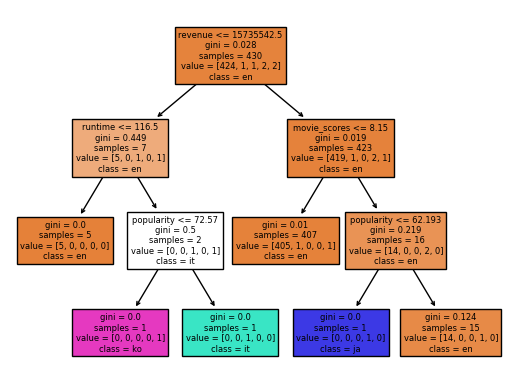

In [68]:
fig = plt.figure()
_ = plot_tree(clf,
                    feature_names = clf.feature_names_in_,
                    class_names = clf.classes_,
                    filled = True)

## What words appear in movies' titles most frequently?

Use wordcloud and plt to display an image containing the most frequent words appearing in movies' title. 
The bigger the word, the more frequently it appears.

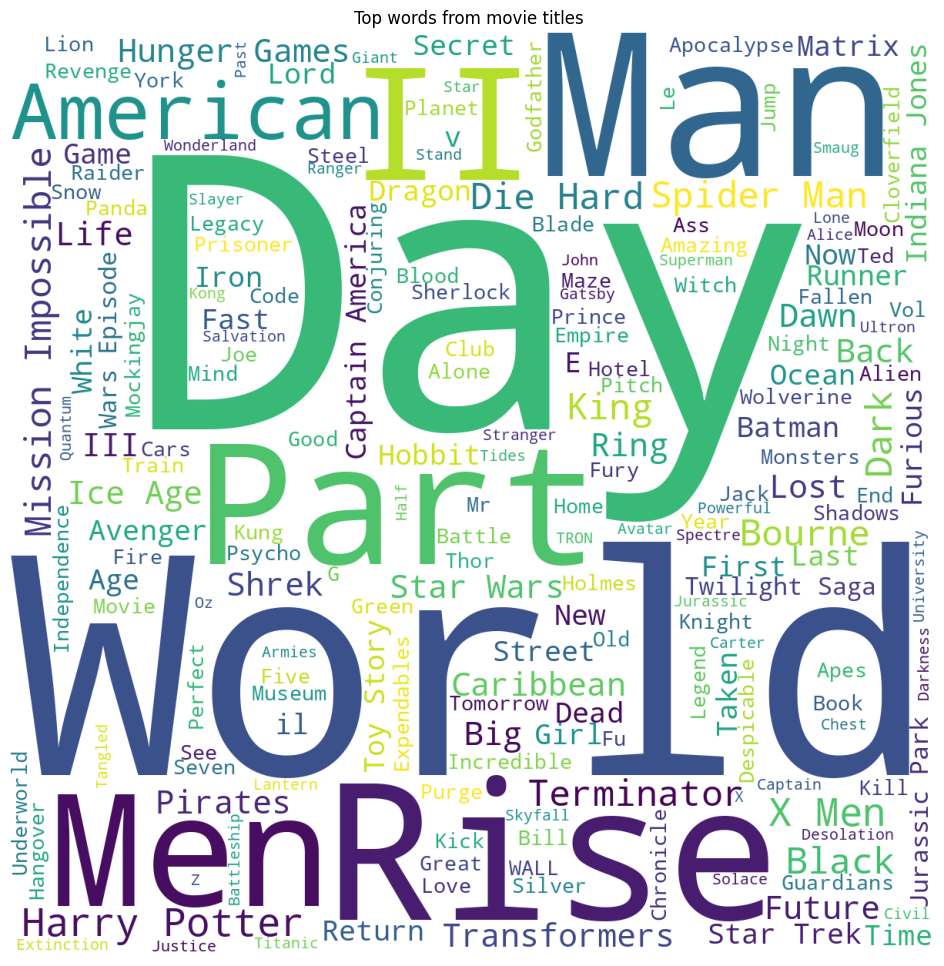

In [69]:
from wordcloud import WordCloud

plt.figure(figsize = (12, 12))
token_title = ' '.join(df8['title'].values) 

wordcloud = WordCloud(max_font_size=None, background_color='white', width=1200, height=1200).generate(token_title)
plt.imshow(wordcloud)
plt.title('Top words from movie titles ')
plt.axis("off") 
plt.show()

## Summary

Throughout this project, I investigate several important features of a movie, and find out their contribution upon whether the movie is a commercial success. It turns out that a high popularity movie is more likely to generate good revenue than a highly-rated movie. I also show the audience some interesting ranking of the movies.

## References

Your code above should include references.  Here is some additional space for references.

* What is the source of your dataset(s)?

https://www.kaggle.com/datasets/tmdb/tmdb-movie-metadata

* List any other references that you found helpful.

https://help.imdb.com/article/imdb/track-movies-tv/ratings-faq/G67Y87TFYYP6TWAV#
https://medium.com/analytics-vidhya/how-to-use-machine-learning-approach-to-predict-movie-box-office-revenue-success-e2e688669972

https://www.analyticsvidhya.com/blog/2021/05/how-to-build-word-cloud-in-python/
https://www.kaggle.com/code/ibtesama/getting-started-with-a-movie-recommendation-system

## Submission

Using the Share button at the top right, **enable Comment privileges** for anyone with a link to the project. Then submit that link on Canvas.

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=bd32a67a-e80b-4a4d-b34c-dc59f2edbbf6' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>